# Class Statistics

In [64]:
# Packages
import pandas as pd
import matplotlib.pyplot as plt
import dataframe_image as dfi # NOTE: YOU MUST HAVE GOOGLE CHROME INSTALLED FOR THIS TO WORK CORRECTLY
import os
# Set seed for reproducibility
import numpy as np
np.random.seed(290)

### Load data

In [65]:
# Load names and proposed classes dataset
# Excel file "~/Box/INFO 290T Project/Names and Proposed Classes.xlsx"
names_and_proposed_classes = pd.read_excel('~/Box/INFO 290T Project/Names and Proposed Classes.xlsx')
names_and_proposed_classes

,Name,Class
0,AM General Hummer SUV 2000,SUV
1,Acura RL Sedan 2012,Sedan
2,Acura TL Sedan 2012,Sedan
3,Acura TL Type-S 2008,Sedan
4,Acura TSX Sedan 2012,Sedan
...,...,...
191,Volkswagen Beetle Hatchback 2012,Hatchback
192,Volvo C30 Hatchback 2012,Hatchback
193,Volvo 240 Sedan 1993,Sedan
194,Volvo XC90 SUV 2007,SUV


  Proposed Class  Original Classes (Make, Model, Year)
0          Sedan                                    51
1            SUV                                    37
2          Coupe                                    32
3    Convertible                                    26
4         Pickup                                    16
5      Hatchback                                    13
6          Wagon                                     7
7            Van                                     7
8        Minivan                                     6
9          Hatch                                     1


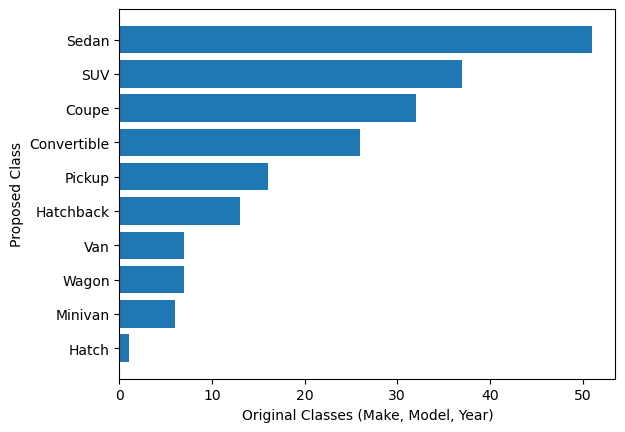

In [66]:
# Proposed classes and counts in original data
# Rename columns
proposed_classes = names_and_proposed_classes['Class'].value_counts().reset_index().rename(columns={'Class': 'Proposed Class', 'count': 'Original Classes (Make, Model, Year)'})
proposed_classes_sorted = proposed_classes.sort_values(by='Original Classes (Make, Model, Year)', ascending=True)
print(proposed_classes)

# Bar chart of counts by Class
# Horizontal bar chart
plt.barh(proposed_classes_sorted['Proposed Class'], proposed_classes_sorted['Original Classes (Make, Model, Year)'])
plt.xlabel('Original Classes (Make, Model, Year)')
plt.ylabel('Proposed Class')
plt.savefig('../../Output/Class Statistics/Original_Classes_by_Proposed_Class.png', bbox_inches='tight')

## Using Annotations Data for More Statistics

Images per category

In [67]:
# Bring in '~\Box\INFO 290T Project\Intermediate Data\cars_annos.xslx'
cars_annos = pd.read_excel('~/Box/INFO 290T Project/Intermediate Data/cars_annos.xlsx')
cars_annos

,Class,filename,x1,y1,x2,y2,old_class,test,old_class_name,im_path,width,height,num_pixels,test_80_20
0,SUV,00076.jpg,11,13,84,60,1,1,AM General Hummer SUV 2000,/Box/INFO 290T Project/Raw Data/Stanford Car D...,96,64,6144,0
1,SUV,00457.jpg,31,20,226,119,1,1,AM General Hummer SUV 2000,/Box/INFO 290T Project/Raw Data/Stanford Car D...,250,144,36000,0
2,SUV,00684.jpg,111,54,365,190,1,1,AM General Hummer SUV 2000,/Box/INFO 290T Project/Raw Data/Stanford Car D...,373,216,80568,0
3,SUV,01117.jpg,45,39,729,414,1,1,AM General Hummer SUV 2000,/Box/INFO 290T Project/Raw Data/Stanford Car D...,800,600,480000,0
4,SUV,01167.jpg,14,16,268,169,1,1,AM General Hummer SUV 2000,/Box/INFO 290T Project/Raw Data/Stanford Car D...,278,182,50596,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16180,Convertible,07537.jpg,47,65,249,180,196,0,smart fortwo Convertible 2012,/Box/INFO 290T Project/Raw Data/Stanford Car D...,262,193,50566,0
16181,Convertible,07594.jpg,29,34,381,273,196,0,smart fortwo Convertible 2012,/Box/INFO 290T Project/Raw Data/Stanford Car D...,400,300,120000,0
16182,Convertible,07846.jpg,78,289,669,633,196,0,smart fortwo Convertible 2012,/Box/INFO 290T Project/Raw Data/Stanford Car D...,1024,683,699392,0
16183,Convertible,07895.jpg,31,6,494,272,196,0,smart fortwo Convertible 2012,/Box/INFO 290T Project/Raw Data/Stanford Car D...,500,272,136000,0


Class
Sedan          4211
SUV            3100
Coupe          2657
Convertible    2058
Pickup         1349
Hatchback      1103
Van             578
Wagon           576
Minivan         498
Hatch            55
Name: count, dtype: int64


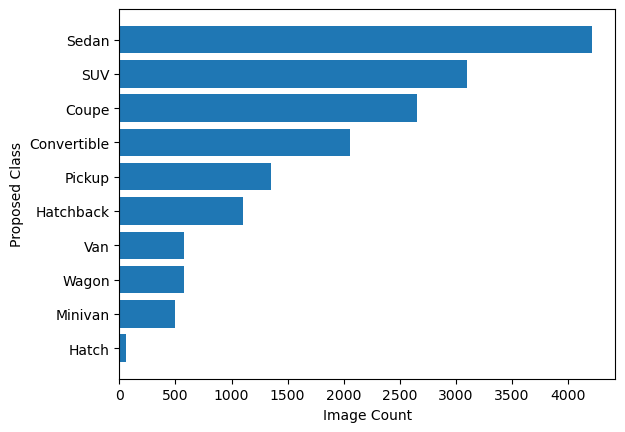

In [68]:
# Counts by Class
print(cars_annos['Class'].value_counts())

# Horizontal bar chart of counts by Class
sorted_values = cars_annos['Class'].value_counts().sort_values(ascending=True)
plt.barh(sorted_values.index, sorted_values)
plt.xlabel('Image Count')
plt.ylabel('Proposed Class')
plt.savefig('../../Output/Class Statistics/Image_Counts_by_Proposed_Class.png', bbox_inches='tight')

In [69]:
# Image counts by class
image_counts_by_class = (cars_annos['Class'].value_counts().reset_index().rename(columns={'count': 'Count'})
                         .style
                            .format(precision=2, thousands=",", decimal=".")
                            .set_table_styles([dict(selector='th', props=[('text-align', 'center')])])
                            .set_properties(**{'text-align': 'center'})
                            .hide(axis="index"))

# Export
dfi.export(image_counts_by_class, '../../Output/Class Statistics/Image_Counts_by_Class_Table.png')

image_counts_by_class

Class,Count
Sedan,"4,211"
SUV,"3,100"
Coupe,"2,657"
Convertible,"2,058"
Pickup,"1,349"
Hatchback,"1,103"
Van,578
Wagon,576
Minivan,498
Hatch,55


## Sample Images for Top 5 Classes

Note: may change to exclude Coupe, as it seems poorly defined.

In [70]:
top_5_classes = cars_annos['Class'].value_counts().head(5).index
# Selected classes
selected_classes_df = cars_annos[cars_annos['Class'].isin(top_5_classes)]
# Sample 5 rows for each of the top 5 classes
top_5_classes_sample_images = selected_classes_df.groupby('Class').apply(lambda x: x.sample(5)).reset_index(drop=True)
top_5_classes_sample_images

,Class,filename,x1,y1,x2,y2,old_class,test,old_class_name,im_path,width,height,num_pixels,test_80_20
0,Convertible,03226.jpg,50,90,285,234,38,1,BMW Z4 Convertible 2012,/Box/INFO 290T Project/Raw Data/Stanford Car D...,396,264,104544,1
1,Convertible,06902.jpg,283,346,1357,877,55,0,Chevrolet Corvette Convertible 2012,/Box/INFO 290T Project/Raw Data/Stanford Car D...,1600,1200,1920000,0
2,Convertible,02428.jpg,5,5,92,62,123,0,Geo Metro Convertible 1993,/Box/INFO 290T Project/Raw Data/Stanford Car D...,92,69,6348,0
3,Convertible,03589.jpg,57,70,578,328,8,0,Aston Martin V8 Vantage Convertible 2012,/Box/INFO 290T Project/Raw Data/Stanford Car D...,640,361,231040,0
4,Convertible,04779.jpg,50,44,230,156,39,0,Bentley Continental Supersports Conv. Converti...,/Box/INFO 290T Project/Raw Data/Stanford Car D...,300,168,50400,0
5,Coupe,01632.jpg,118,53,217,230,152,0,Lamborghini Gallardo LP 570-4 Superleggera 2012,/Box/INFO 290T Project/Raw Data/Stanford Car D...,586,421,246706,0
6,Coupe,03068.jpg,10,64,416,313,128,1,Honda Accord Coupe 2012,/Box/INFO 290T Project/Raw Data/Stanford Car D...,424,360,152640,0
7,Coupe,00691.jpg,51,87,563,398,172,1,Plymouth Neon Coupe 1999,/Box/INFO 290T Project/Raw Data/Stanford Car D...,640,480,307200,0
8,Coupe,03277.jpg,156,228,515,423,56,1,Chevrolet Corvette ZR1 2012,/Box/INFO 290T Project/Raw Data/Stanford Car D...,640,480,307200,0
9,Coupe,02194.jpg,626,641,1449,1021,163,1,Mercedes-Benz SL-Class Coupe 2009,/Box/INFO 290T Project/Raw Data/Stanford Car D...,1600,1063,1700800,1


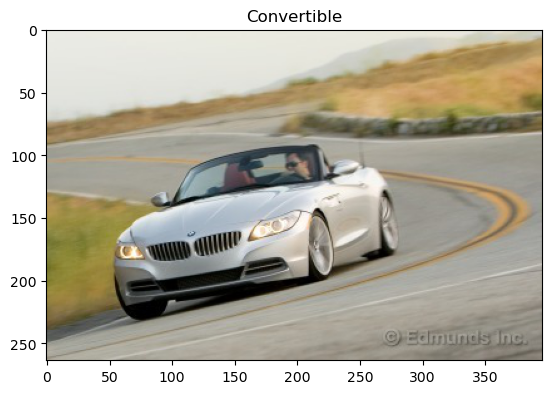

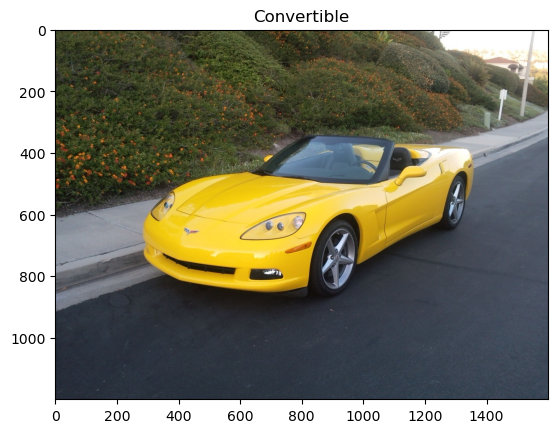

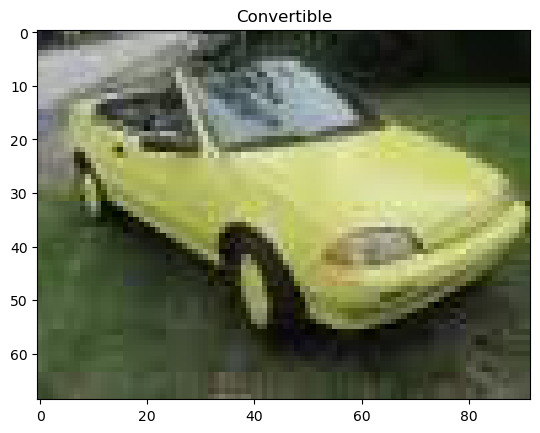

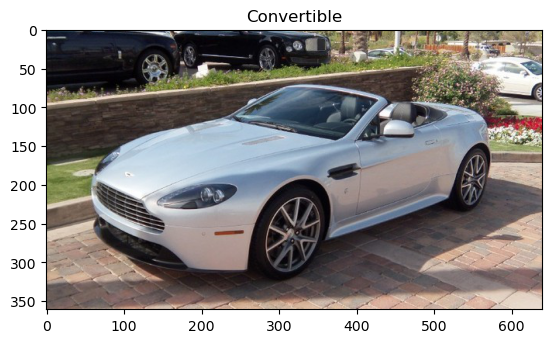

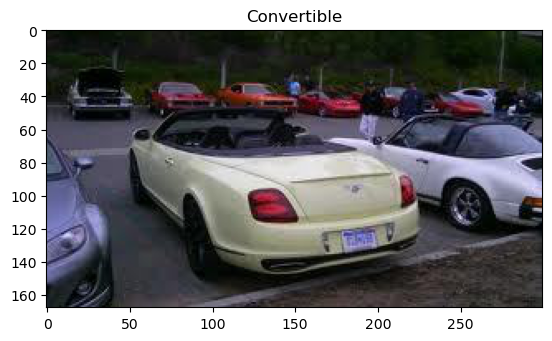

...

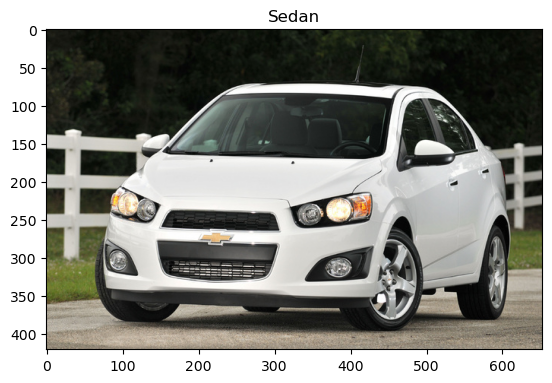

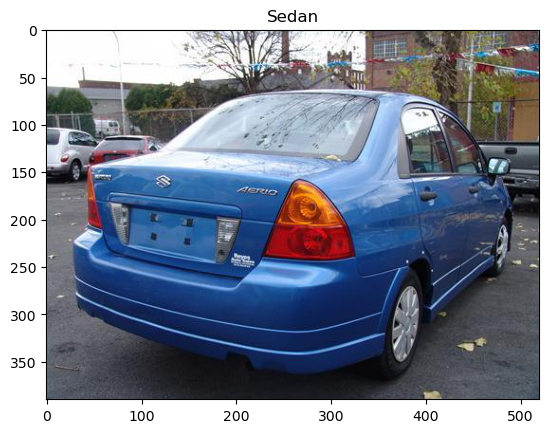

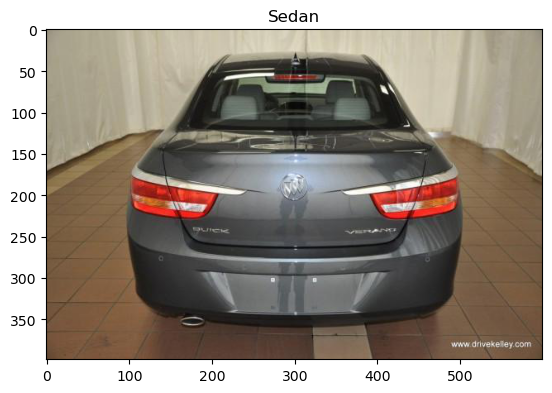

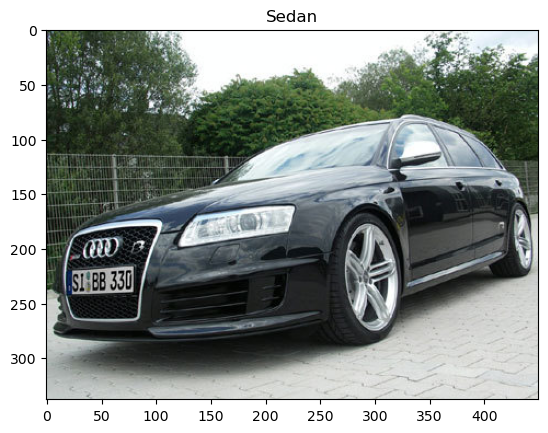

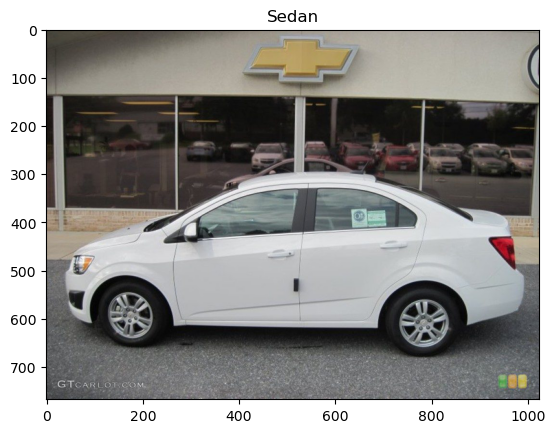

In [71]:
# Iterate over each of the top 5 classes
# Load and print images
loaded_images = []
loaded_image_classes = []
for i in range(len(top_5_classes_sample_images)):
    img = plt.imread(os.path.expanduser('~') + top_5_classes_sample_images['im_path'].iloc[i])
    plt.imshow(img)
    plt.title(top_5_classes_sample_images['Class'].iloc[i])
    # Make directory if not exists
    if not os.path.exists(f'../../Output/Class Statistics/Class Sample Images/{top_5_classes_sample_images["Class"].iloc[i]}'):
        os.makedirs(f'../../Output/Class Statistics/Class Sample Images/{top_5_classes_sample_images["Class"].iloc[i]}')
    plt.savefig(f'../../Output/Class Statistics/Class Sample Images/{top_5_classes_sample_images["Class"].iloc[i]}/{top_5_classes_sample_images["filename"].iloc[i]}', bbox_inches='tight')
    plt.show()
    loaded_images.append(img)
    loaded_image_classes.append(top_5_classes_sample_images['Class'].iloc[i])

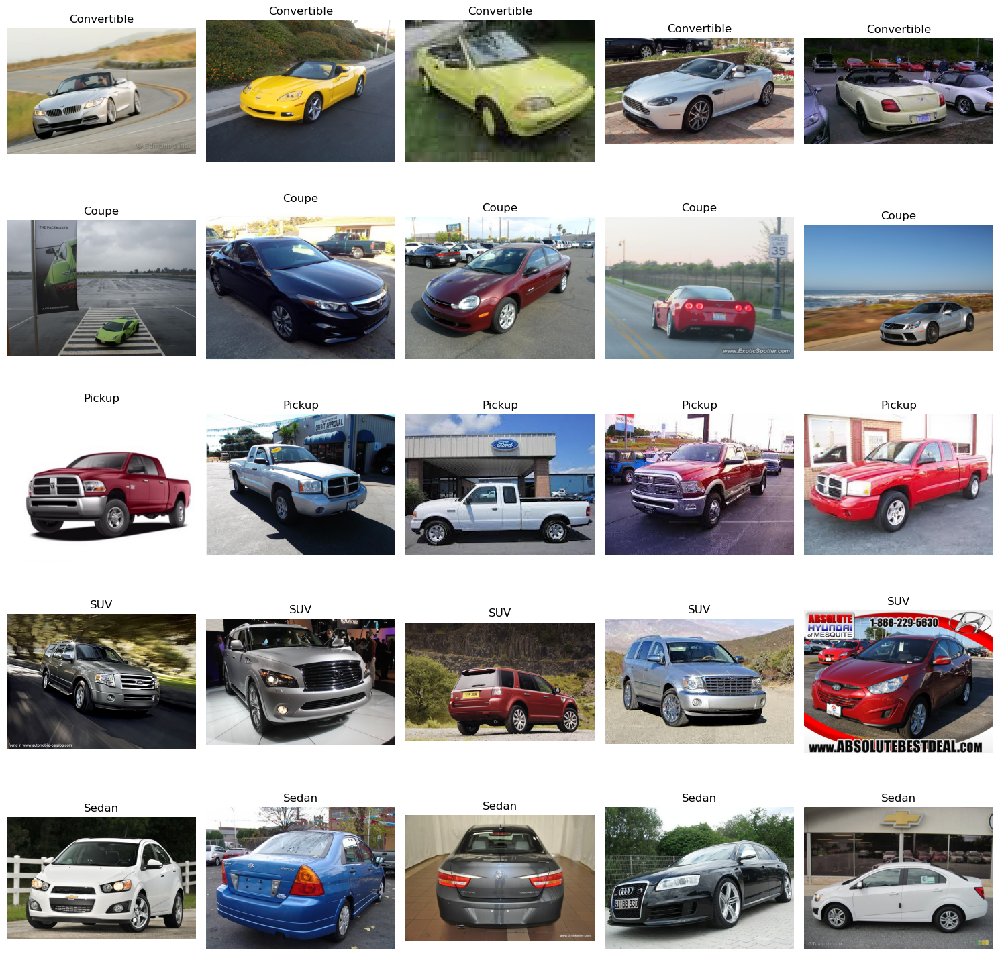

In [78]:
# Use loaded images and loaded image classes to tiled figure
# Label each row with the class
fig, ax = plt.subplots(5, 5, figsize=(15, 15))
for i in range(5):
    for j in range(5):
        ax[i, j].imshow(loaded_images[i * 5 + j])
        ax[i, j].set_title(loaded_image_classes[i * 5 + j])
        ax[i, j].axis('off')
plt.tight_layout()
plt.savefig('../../Output/Class Statistics/Class Sample Images/Top_5_Classes_Sample_Images.png', bbox_inches='tight')
plt.show()

### Classes and Original Train-Test Split

In [79]:
# Counts by test
# Create split variable as Train or Test
#print(selected_classes_df['test'].value_counts())
selected_classes_df['Split'] = np.where(selected_classes_df['test'] == 0.0, 'Train', 'Test')
#print(selected_classes_df['Split'].value_counts())
orig_split_classes = (pd.DataFrame(selected_classes_df[['Class', 'Split']]
                                   .value_counts())
                                   .reset_index()
                                   .pivot(index='Class', columns='Split', values='count')
                                   .reset_index()
                                   .style
                                   .format(precision=2, thousands=",", decimal=".")
                                   .set_table_styles([dict(selector='th', props=[('text-align', 'center')])])
                                   .set_properties(**{'text-align': 'center'})
                                   .hide(axis="index")
    )

# Export
dfi.export(orig_split_classes, '../../Output/Class Statistics/Original_Split_Classes.png')

orig_split_classes

C:\Users\ijyli\AppData\Local\Temp\ipykernel_3196\3726103375.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_classes_df['Split'] = np.where(selected_classes_df['test'] == 0.0, 'Train', 'Test')


Class,Test,Train
Convertible,"1,022","1,036"
Coupe,"1,320","1,337"
Pickup,671,678
SUV,"1,540","1,560"
Sedan,"2,091","2,120"


In [80]:
# Data with resolution restriction
res_restricted = selected_classes_df[(selected_classes_df['height'] > 200) | (selected_classes_df['width'] > 350)]

In [81]:
# Check with resolution restriction
original_split_classes_res_restriction = (pd.DataFrame(res_restricted[['Class', 'Split']]
                                   .value_counts())
                                   .reset_index()
                                   .pivot(index='Class', columns='Split', values='count')
                                   .reset_index()
                                   .style
                                   .format(precision=2, thousands=",", decimal=".")
                                   .set_table_styles([dict(selector='th', props=[('text-align', 'center')])])
                                   .set_properties(**{'text-align': 'center'})
                                   .hide(axis="index")
    )

# Export
dfi.export(original_split_classes_res_restriction, '../../Output/Class Statistics/Original_Split_Classes_Res_Restriction.png')

original_split_classes_res_restriction

Class,Test,Train
Convertible,838,839
Coupe,"1,136","1,138"
Pickup,504,503
SUV,"1,308","1,346"
Sedan,"1,841","1,871"


In [82]:
# Check with 80-20 split
# Create split variable as Train or Test
#print(selected_classes_df['test'].value_counts())
selected_classes_df['Split_80_20'] = np.where(selected_classes_df['test_80_20'] == 0.0, 'Train', 'Test')
#print(selected_classes_df['Split'].value_counts())
split_80_20_classes = (pd.DataFrame(selected_classes_df[['Class', 'Split_80_20']]
                                   .value_counts())
                                   .reset_index()
                                   .pivot(index='Class', columns='Split_80_20', values='count')
                                   .reset_index()
                                   .style
                                   .format(precision=2, thousands=",", decimal=".")
                                   .set_table_styles([dict(selector='th', props=[('text-align', 'center')])])
                                   .set_properties(**{'text-align': 'center'})
                                   .hide(axis="index")
    )

# Export
dfi.export(split_80_20_classes, '../../Output/Class Statistics/80_20_Split_Classes.png')

split_80_20_classes

C:\Users\ijyli\AppData\Local\Temp\ipykernel_3196\1333785891.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_classes_df['Split_80_20'] = np.where(selected_classes_df['test_80_20'] == 0.0, 'Train', 'Test')


Class,Test,Train
Convertible,402,"1,656"
Coupe,538,"2,119"
Pickup,290,"1,059"
SUV,619,"2,481"
Sedan,862,"3,349"


In [83]:
# Check with 80-20 split and resolution restriction
res_restricted['Split_80_20'] = np.where(res_restricted['test_80_20'] == 0.0, 'Train', 'Test')
split_80_20_classes_res_restricted = (pd.DataFrame(res_restricted[['Class', 'Split_80_20']]
                                   .value_counts())
                                   .reset_index()
                                   .pivot(index='Class', columns='Split_80_20', values='count')
                                   .reset_index()
                                   .style
                                   .format(precision=2, thousands=",", decimal=".")
                                   .set_table_styles([dict(selector='th', props=[('text-align', 'center')])])
                                   .set_properties(**{'text-align': 'center'})
                                   .hide(axis="index")
    )

# Export
dfi.export(split_80_20_classes_res_restricted, '../../Output/Class Statistics/80_20_Split_Classes_Res_Restricted.png')

split_80_20_classes_res_restricted

C:\Users\ijyli\AppData\Local\Temp\ipykernel_3196\757666655.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  res_restricted['Split_80_20'] = np.where(res_restricted['test_80_20'] == 0.0, 'Train', 'Test')


Class,Test,Train
Convertible,321,"1,356"
Coupe,460,"1,814"
Pickup,220,787
SUV,526,"2,128"
Sedan,747,"2,965"
